# Task-4 Image Reconstruction using Matrix Factorisation

# Question 4.2

Q2. Consider a case where 900 pixels (30x30) are randomly missing from an image. Reconstruct the image using matrix factorization, plot the reconstructed image, and calculate the RMSE and PSNR metrics. Next, reconstruct the same image with the missing pixels using Random Fourier Features (RFF) and Linear Regression. Compute the RMSE and PSNR for both methods, and compare the results to see which performs better.

### Importing Required Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn import preprocessing

# remove all warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision

# check if CUDA is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print('Number of GPUs:', torch.cuda.device_count())
torch.cuda.set_device(0)

Using device: cuda
Number of GPUs: 1


In [3]:
# Setting the seed for Python, NumPy, and PyTorch (both CPU and GPU)
def set_seed(seed=42):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)  # if using CUDA
    torch.cuda.manual_seed_all(seed)  # for multi-GPU
    torch.backends.cudnn.deterministic = True  # Ensures deterministic behavior
    torch.backends.cudnn.benchmark = False     # Disables the auto-tuner that finds the best algorithm

set_seed(42)

### Load image

In [4]:
img = torchvision.io.read_image('./iitgn.jpg')
print(img.shape)

torch.Size([3, 640, 1280])


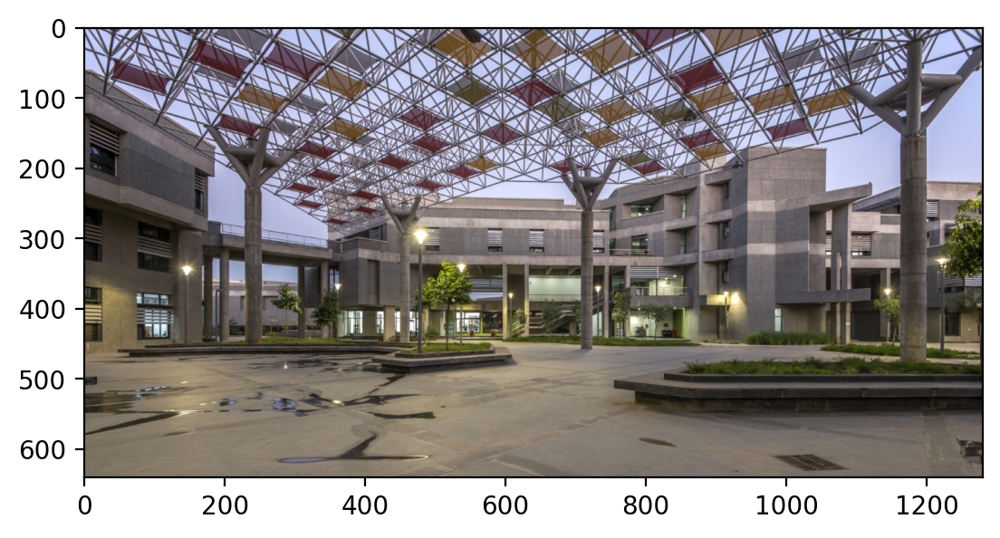

In [5]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

### Scale the image to [0,1]

In [6]:
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

In [7]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled = torch.tensor(img_scaled)

img_scaled = img_scaled.to(device)
print("Shape of the scaled image:", img_scaled.shape)
img_scaled

Shape of the scaled image: torch.Size([3, 640, 1280])


tensor([[[0.7922, 0.7490, 0.7804,  ..., 0.7451, 0.7647, 0.7569],
         [0.7725, 0.7647, 0.7765,  ..., 0.7490, 0.7529, 0.7451],
         [0.7137, 0.7373, 0.8039,  ..., 0.7412, 0.7490, 0.7451],
         ...,
         [0.4784, 0.4784, 0.4784,  ..., 0.4667, 0.4706, 0.4745],
         [0.4784, 0.4784, 0.4784,  ..., 0.4706, 0.4667, 0.4667],
         [0.4784, 0.4745, 0.4745,  ..., 0.4706, 0.4667, 0.4627]],

        [[0.8392, 0.7922, 0.8039,  ..., 0.8157, 0.8314, 0.8235],
         [0.8353, 0.8118, 0.8078,  ..., 0.8235, 0.8196, 0.8078],
         [0.7804, 0.7961, 0.8471,  ..., 0.8235, 0.8118, 0.7922],
         ...,
         [0.4431, 0.4431, 0.4431,  ..., 0.4314, 0.4353, 0.4392],
         [0.4431, 0.4431, 0.4431,  ..., 0.4353, 0.4314, 0.4314],
         [0.4431, 0.4392, 0.4392,  ..., 0.4353, 0.4314, 0.4275]],

        [[1.0000, 0.9686, 0.9373,  ..., 0.9569, 1.0000, 1.0000],
         [1.0000, 1.0000, 0.9608,  ..., 0.9882, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 0.

### Crop the image

torch.Size([3, 300, 300])


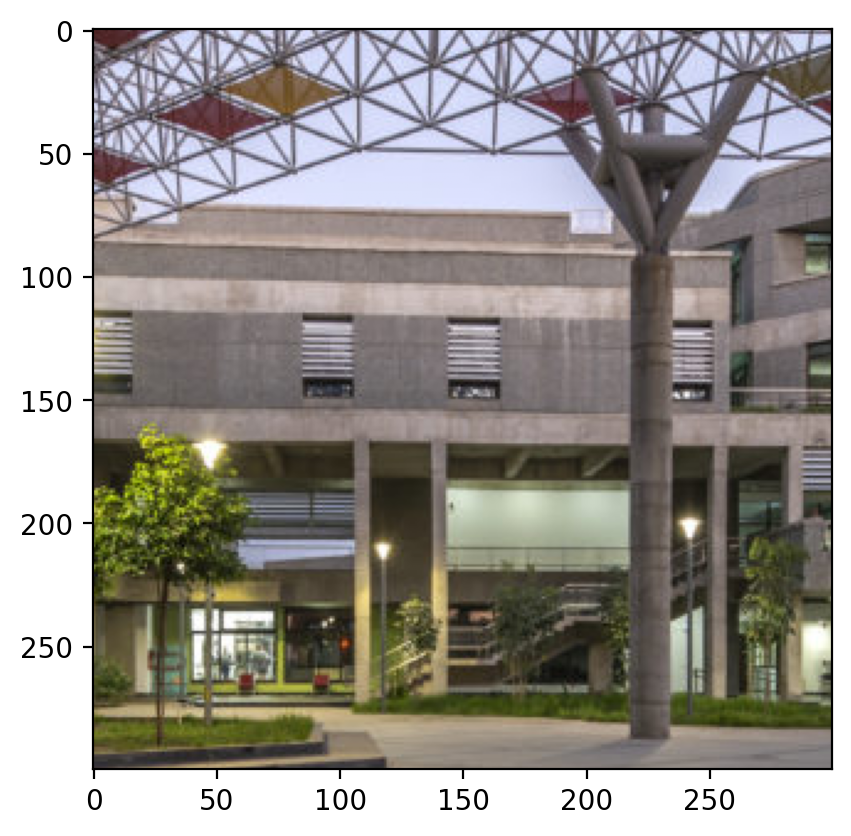

In [8]:
crop = torchvision.transforms.CenterCrop(300)(img_scaled)
print(crop.shape)
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
crop = crop.to(device)

### Masking a square patch on the image

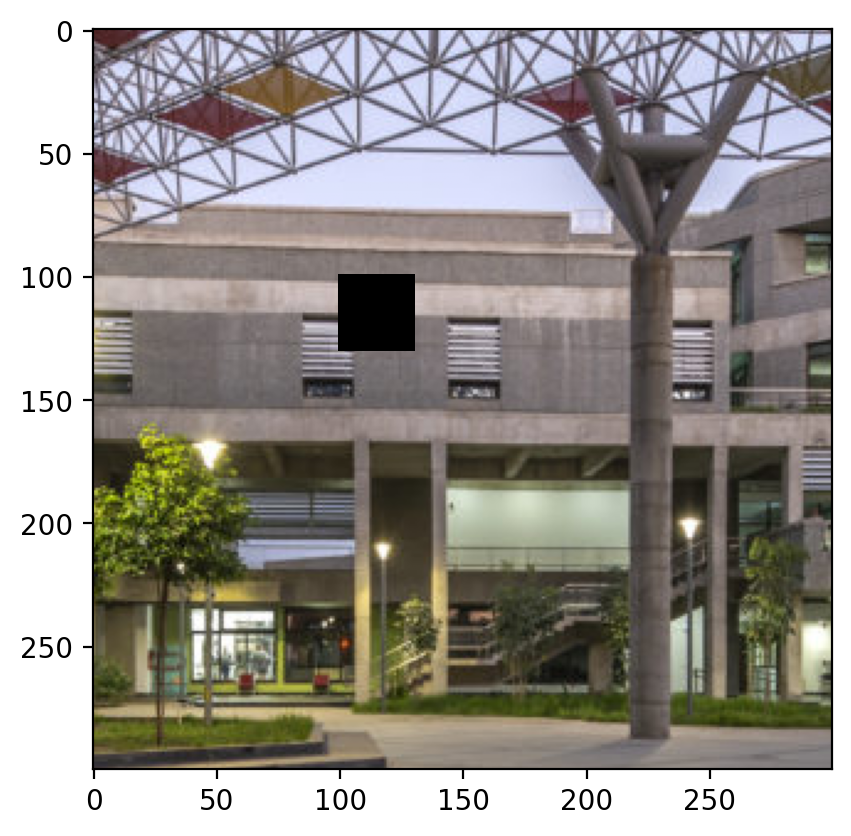

In [9]:
channels, height, width = crop.shape

patch_size = 30

if patch_size > height or patch_size > width:
    raise ValueError("Patch size must be smaller than the dimensions of the image.")

# # for random patch
# margin = 30  # margin to avoid the corners
# top_left_x = np.random.randint(margin, height - patch_size - margin)
# top_left_y = np.random.randint(margin, width - patch_size - margin)

top_left_x = 100
top_left_y = 100

# Remove the patch from the image
masked_img = crop.clone()
masked_img[:, top_left_x:top_left_x + patch_size, top_left_y:top_left_y + patch_size] = float('nan')

plt.imshow(rearrange(masked_img, 'c h w -> h w c').cpu().numpy())


## Reconstruction using Matrix Factorization

In [10]:
def matrix_factorization(image_tensor, rank, learning_rate=0.01, num_epochs=5000, tol=1e-6, device=torch.device("cpu")):
    """
    Perform matrix factorization using Alternating Least Squares (ALS) algorithm.
    
    Args:
        image_tensor (torch.Tensor): The image tensor to be factorized.
        rank (int): The rank of the factorization.
        learning_rate (float): The learning rate for optimization.
        num_epochs (int): The number of epochs to train the model.
        tol (float): The tolerance for convergence.
        device (torch.device): The device to run the optimization.
    
    Returns:
        W (torch.Tensor): The basis matrix.
        H (torch.Tensor): The coefficient matrix.
        loss (torch.Tensor): The final loss.
        loss_list (list): The list of losses at each epoch.
    """
    image_tensor = image_tensor.to(device)
    channels, height, width = image_tensor.shape
    W = torch.randn(channels, height, rank, requires_grad=True, device=device)
    H = torch.randn(channels, rank, width, requires_grad=True, device=device)
    optimizer = optim.Adam([W, H], lr=learning_rate)
    mask = ~torch.isnan(image_tensor)
    loss_list = []
    prev_loss = float('inf')
    for i in range(1, num_epochs + 1):
        diff_matrix = torch.einsum('chr,crw->chw', W, H) - image_tensor
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)
        loss_list.append(loss.item())
        if i % 1000 == 0:
            print(f"Iteration {i}, loss: {loss.item()}")

        if abs(prev_loss - loss.item()) < tol:
            print(f"Converged at iteration {i}, loss: {loss.item()}")
            break
        prev_loss = loss.item()
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    return W, H, loss_list


def plot_result(original_img, masked_img, reconstructed_img, rank, mask_value):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f"Image Reconstruction with Rank={rank} and Mask={mask_value}x{mask_value} patch")
    # Original image
    axes[0].imshow(rearrange(original_img, 'c h w -> h w c').cpu().numpy())
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    # Masked image
    axes[1].imshow(rearrange(masked_img, 'c h w -> h w c').cpu().numpy())
    axes[1].set_title("Masked Image")
    axes[1].axis('off')
    # Reconstructed image
    axes[2].imshow(rearrange(reconstructed_img, 'c h w -> h w c').cpu().detach().numpy())
    axes[2].set_title("Reconstructed Image")
    axes[2].axis('off')
    plt.show()


def calculate_rmse_psnr(original_img, reconstructed_img):
    """
    Calculate the Root Mean Squared Error (RMSE) and Peak Signal-to-Noise Ratio (PSNR) between the original and reconstructed images.
    
    Args:
        original_img (torch.Tensor): The original image tensor.
        reconstructed_img (torch.Tensor): The reconstructed image tensor.
    
    Returns:
        rmse (float): The Root Mean Squared Error (RMSE).
        psnr (float): The Peak Signal-to-Noise Ratio (PSNR).
    """
    if original_img.device != reconstructed_img.device:
        original_img = original_img.to(reconstructed_img.device)
    
    mse = F.mse_loss(reconstructed_img, original_img)
    rmse = torch.sqrt(mse)
    max_pixel_value = 1.0
    psnr = 20 * torch.log10(max_pixel_value / rmse)
    print(f"RMSE: {rmse.item()}")
    print(f"PSNR: {psnr.item()}")
    return rmse.item(), psnr.item()


In [11]:
def image_reconstruction_matrix(img, masked_img, rank, learning_rate=0.01, num_epochs=10000, tol=1e-6, plot=False, keep_original=True, device=torch.device("cpu")):
    """
    Reconstruct the image by filling in the missing patch using matrix factorization.
    
    Args:
        img (torch.Tensor): The original image tensor.
        masked_img (torch.Tensor): The masked image tensor.
        rank (int): The rank of the factorization.
        learning_rate (float): The learning rate for optimization.
        num_epochs (int): The number of epochs to train the model.
        tol (float): The tolerance for convergence.
        plot (bool): Whether to plot the results.
        keep_original (bool): Whether to replace the earlier non-masked pixels in the reconstructed image.
        device (torch.device): The device to run the optimization.
    
    Returns:
        reconstructed_img (torch.Tensor): The reconstructed image tensor.
        loss_list (list): The list of losses at each epoch.
        rmse (float): The Root Mean Squared Error.
        psnr (float): The Peak Signal-to-Noise Ratio.
    """

    img = img.to(torch.float32)
    masked_img = masked_img.to(torch.float32)
    W, H, loss_list = matrix_factorization(masked_img, rank, learning_rate, num_epochs, tol, device)
    reconstructed_img = torch.einsum('chr,crw->chw', W, H)
    # clamp between 0 and 1
    reconstructed_img = torch.clamp(reconstructed_img, 0, 1)
    
    if keep_original:
        # Replace the earlier non-masked pixels in the reconstructed image
        mask = ~torch.isnan(masked_img)
        reconstructed_img[mask] = img[mask]
    
    rmse, psnr = calculate_rmse_psnr(img, reconstructed_img)
    
    if plot:
        plot_result(img, masked_img, reconstructed_img, rank, patch_size)
    
    return reconstructed_img, loss_list, rmse, psnr

Iteration 1000, loss: 34.498878479003906
Iteration 2000, loss: 27.611167907714844
Iteration 3000, loss: 24.382835388183594
Iteration 4000, loss: 22.48456382751465
Iteration 5000, loss: 21.372554779052734
Iteration 6000, loss: 20.683135986328125
Converged at iteration 6259, loss: 20.520366668701172
RMSE: 0.00782653596252203
PSNR: 42.12860870361328


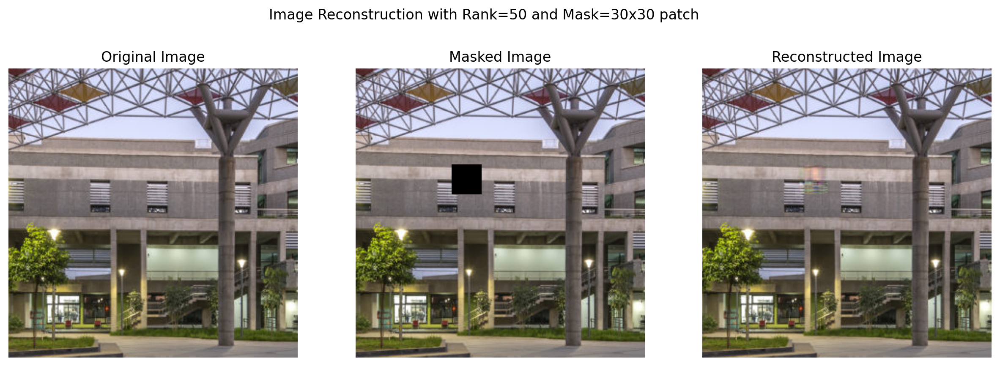

In [12]:
reconstructed_img, loss_list, rmse, psnr = image_reconstruction_matrix(crop, masked_img, rank=50, learning_rate=0.01, num_epochs=10000, tol=1e-6, plot=True, keep_original=True, device=device)

Text(0.5, 1.0, 'Loss vs. Epoch')

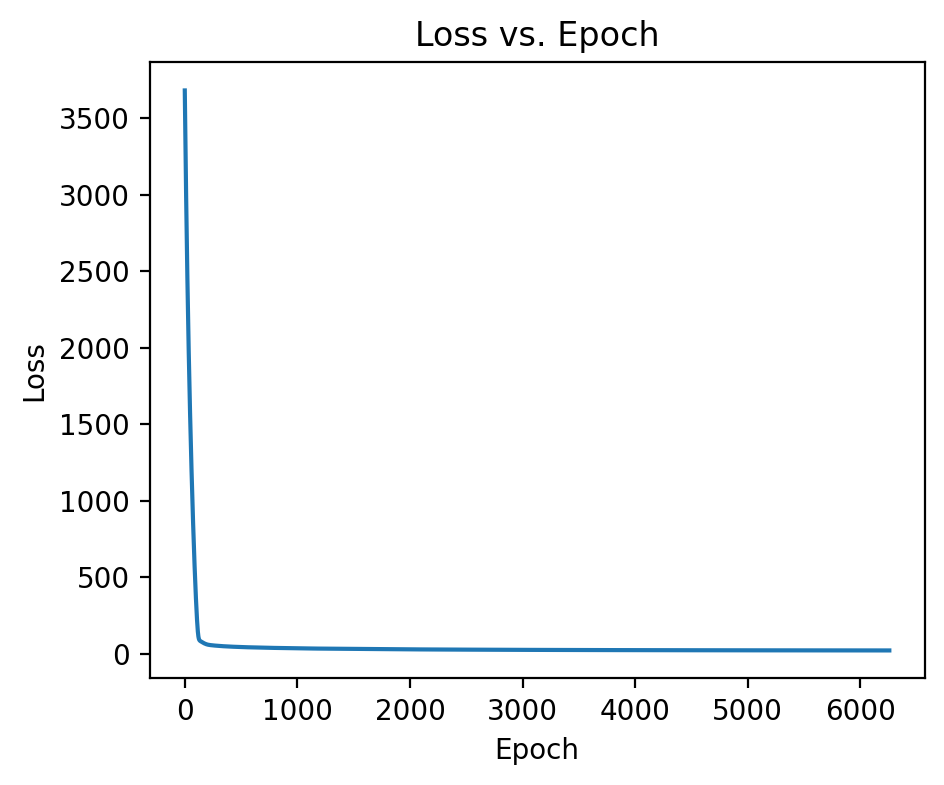

In [13]:
plt.figure(figsize=(5, 4))
plt.plot(loss_list)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss vs. Epoch")

A 30x30 patch was removed from a 300x300 image and matrix factorization with rank=50 was used to reconstruct the matrix with missing values. The gradient descent algorithm converged after 6260 iterations.

The RMSE (Root Mean Squared Error) and PSNR (Peak Signal-to-Noise Ratio) were calculated follows:
- RMSE = 0.0078
- PSNR = 42.1286

# Evaluating Matrix Factorization Performance Across Different Ranks

--------------------------------------------------
Evaluating rank: 5
--------------------------------------------------
Iteration 1000, loss: 69.35663604736328
Iteration 2000, loss: 63.20629119873047
Converged at iteration 2618, loss: 62.5154914855957
RMSE: 0.010828820057213306
PSNR: 39.308380126953125


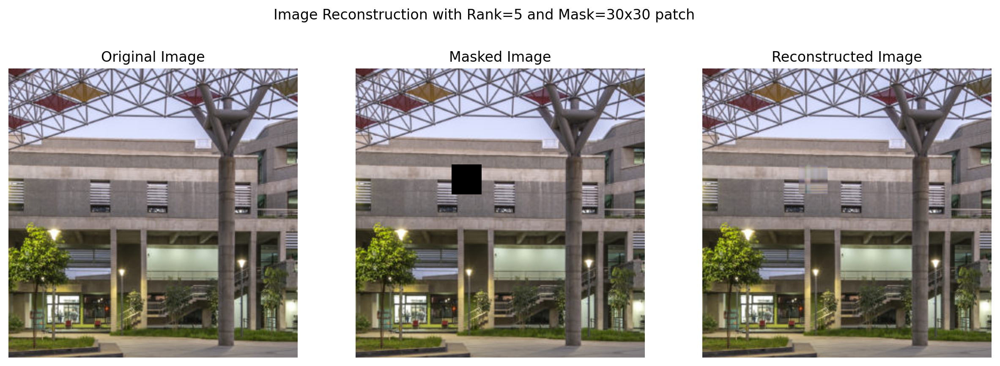




--------------------------------------------------
Evaluating rank: 10
--------------------------------------------------
Iteration 1000, loss: 59.28798294067383
Iteration 2000, loss: 51.6768684387207
Converged at iteration 2450, loss: 50.469688415527344
RMSE: 0.010305396281182766
PSNR: 39.73870849609375


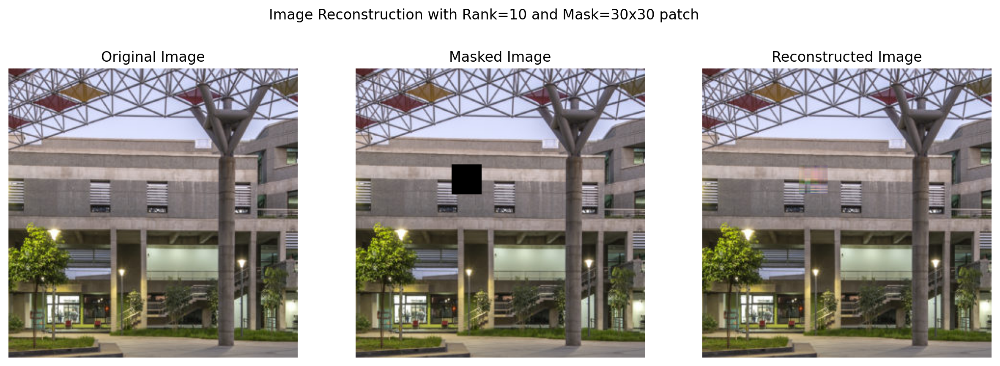




--------------------------------------------------
Evaluating rank: 20
--------------------------------------------------
Iteration 1000, loss: 48.7381477355957
Iteration 2000, loss: 41.312618255615234
Iteration 3000, loss: 38.24516296386719
Iteration 4000, loss: 37.32451629638672
Iteration 5000, loss: 37.14656066894531
Iteration 6000, loss: 37.138309478759766
Iteration 7000, loss: 37.10369873046875
Converged at iteration 7287, loss: 37.082401275634766
RMSE: 0.009703056886792183
PSNR: 40.26183319091797


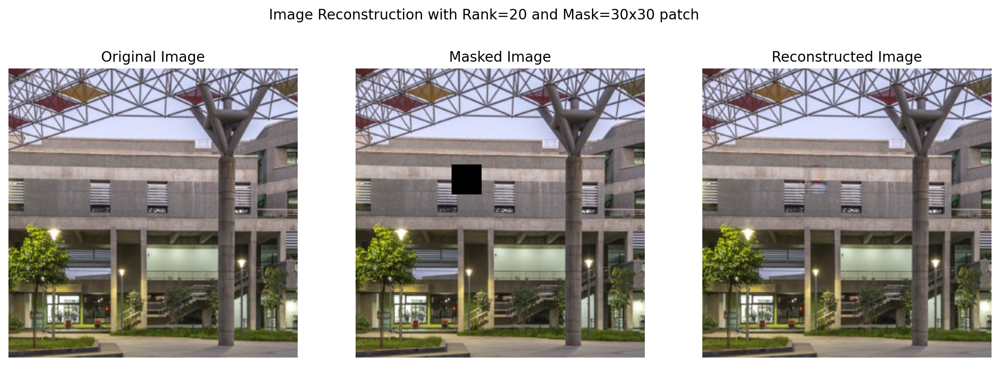




--------------------------------------------------
Evaluating rank: 50
--------------------------------------------------
Iteration 1000, loss: 34.546390533447266
Iteration 2000, loss: 27.548961639404297
Iteration 3000, loss: 24.407779693603516
Iteration 4000, loss: 22.50908851623535
Iteration 5000, loss: 21.40668487548828
Iteration 6000, loss: 20.63465690612793
Converged at iteration 6557, loss: 20.376588821411133
RMSE: 0.007274303585290909
PSNR: 42.7641716003418


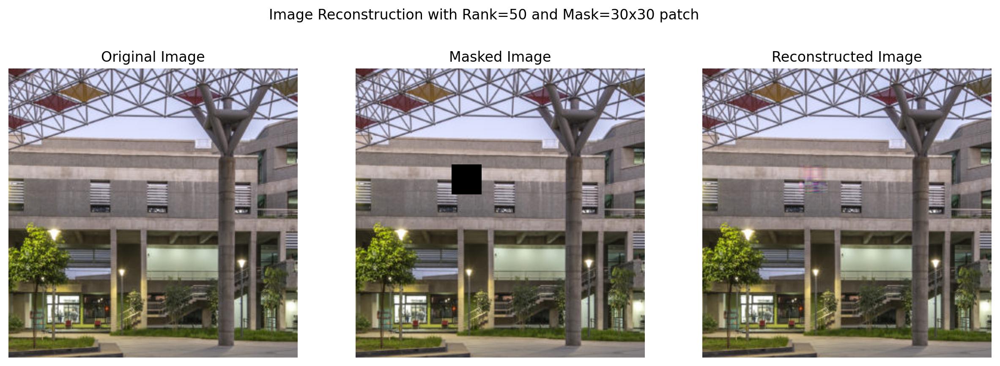




--------------------------------------------------
Evaluating rank: 100
--------------------------------------------------
Iteration 1000, loss: 24.596385955810547
Iteration 2000, loss: 19.394596099853516
Iteration 3000, loss: 16.90200424194336
Iteration 4000, loss: 15.335533142089844
Iteration 5000, loss: 14.286946296691895
Iteration 6000, loss: 13.479101181030273
Converged at iteration 6038, loss: 13.437176704406738
RMSE: 0.009089358150959015
PSNR: 40.82933807373047


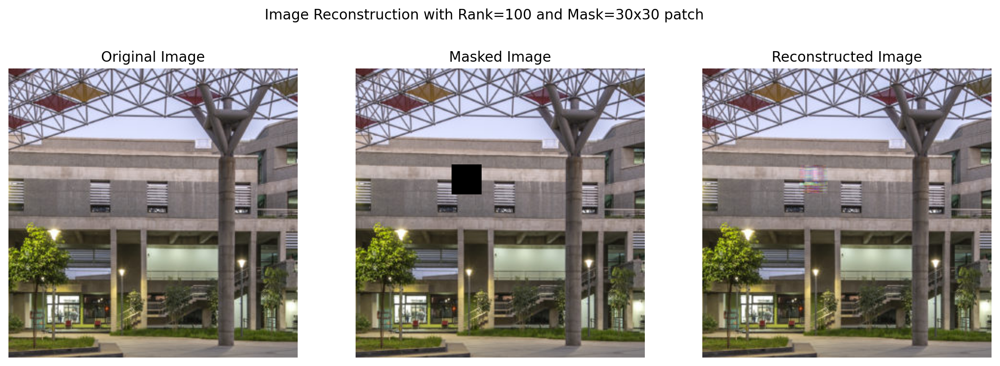




--------------------------------------------------
Evaluating rank: 150
--------------------------------------------------
Iteration 1000, loss: 20.02798080444336
Iteration 2000, loss: 15.951749801635742
Iteration 3000, loss: 13.918944358825684
Converged at iteration 3647, loss: 12.992457389831543
RMSE: 0.010377220809459686
PSNR: 39.67837905883789


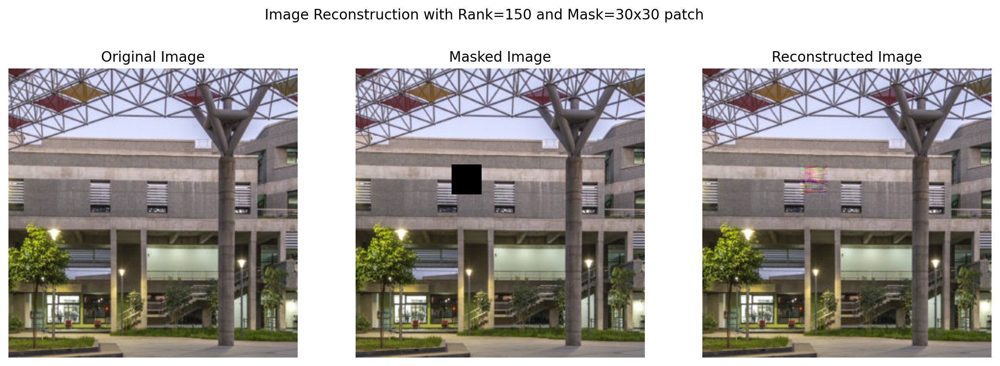




--------------------------------------------------
Evaluating rank: 200
--------------------------------------------------
Iteration 1000, loss: 17.074764251708984
Converged at iteration 1644, loss: 14.598367691040039
RMSE: 0.01427056360989809
PSNR: 36.91117858886719


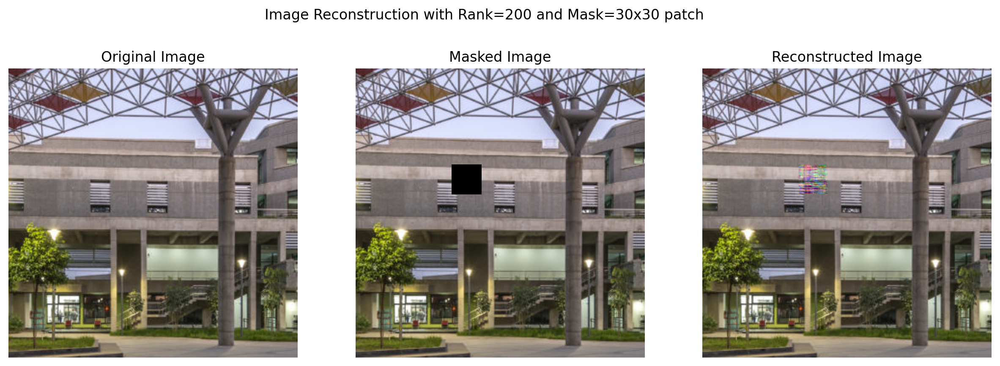




--------------------------------------------------
Evaluating rank: 400
--------------------------------------------------
Iteration 1000, loss: 12.8114652633667
Iteration 2000, loss: 11.397233009338379
Iteration 3000, loss: 10.730422019958496
Converged at iteration 3760, loss: 10.405985832214355
RMSE: 0.05084778368473053
PSNR: 25.87455940246582


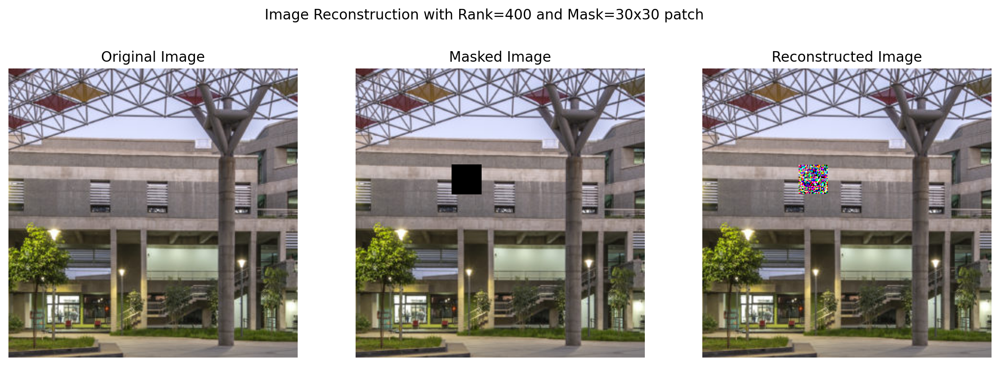

In [19]:
ranks = [5, 10, 20, 50, 100, 150, 200, 400]
results_patch = {}
reconstructed_images_patch = {}

for rank in ranks:
    print("-"*50)
    print(f"Evaluating rank: {rank}")
    print("-"*50)
    reconstructed_img, loss_list, rmse, psnr = image_reconstruction_matrix(
        crop, masked_img, rank, learning_rate=0.01, num_epochs=10000, plot=True, device=device
    )
    
    results_patch[rank] = {'Loss': loss_list[-1], 'RMSE': rmse, 'PSNR': psnr}
    reconstructed_images_patch[rank] = reconstructed_img
    print("\n\n")

## Plotting all reconstructed images

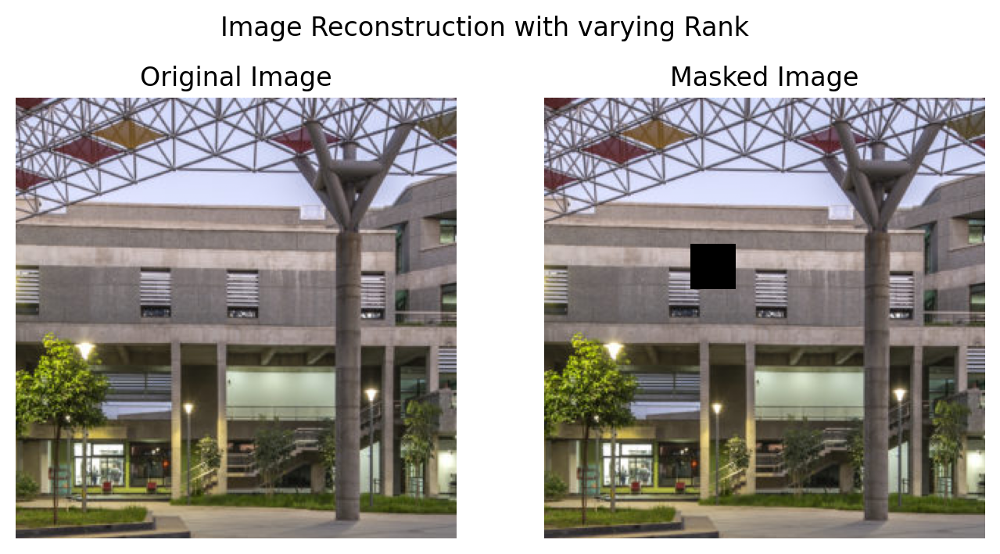

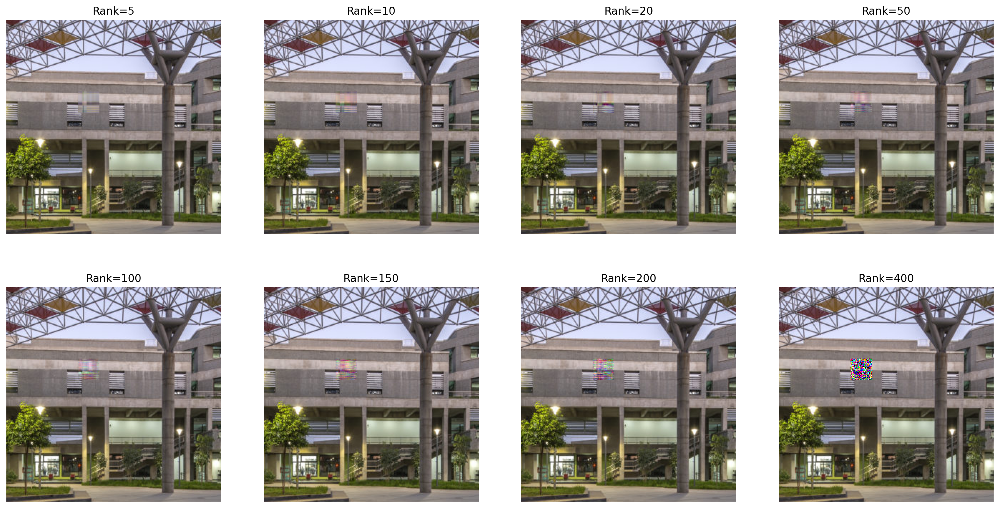

In [20]:
# Show original image, masked image once, and then reconstructed image for each rank
plt.figure(figsize=(8, 4))
plt.suptitle("Image Reconstruction with varying Rank")
# Plot original image
plt.subplot(1, 2, 1)
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
plt.title("Original Image")
plt.axis('off')
# Plot masked image
plt.subplot(1, 2, 2)
plt.imshow(rearrange(masked_img, 'c h w -> h w c').cpu().numpy())
plt.title("Masked Image")
plt.axis('off')
plt.show()

plt.figure(figsize=(20, 10))
# Plot reconstructed images for each rank
for i, rank in enumerate(ranks):
    plt.subplot(2, (len(ranks)+1)//2, i+1)
    plt.imshow(rearrange(reconstructed_images_patch[rank], 'c h w -> h w c').cpu().detach().numpy())
    plt.title(f"Rank={rank}")
    plt.axis('off')
plt.show()

## Performance comparison using different ranks

Rank: 5, Loss: 62.5155, RMSE: 0.0108, PSNR: 39.3084
Rank: 10, Loss: 50.4697, RMSE: 0.0103, PSNR: 39.7387
Rank: 20, Loss: 37.0824, RMSE: 0.0097, PSNR: 40.2618
Rank: 50, Loss: 20.3766, RMSE: 0.0073, PSNR: 42.7642
Rank: 100, Loss: 13.4372, RMSE: 0.0091, PSNR: 40.8293
Rank: 150, Loss: 12.9925, RMSE: 0.0104, PSNR: 39.6784
Rank: 200, Loss: 14.5984, RMSE: 0.0143, PSNR: 36.9112
Rank: 400, Loss: 10.4060, RMSE: 0.0508, PSNR: 25.8746


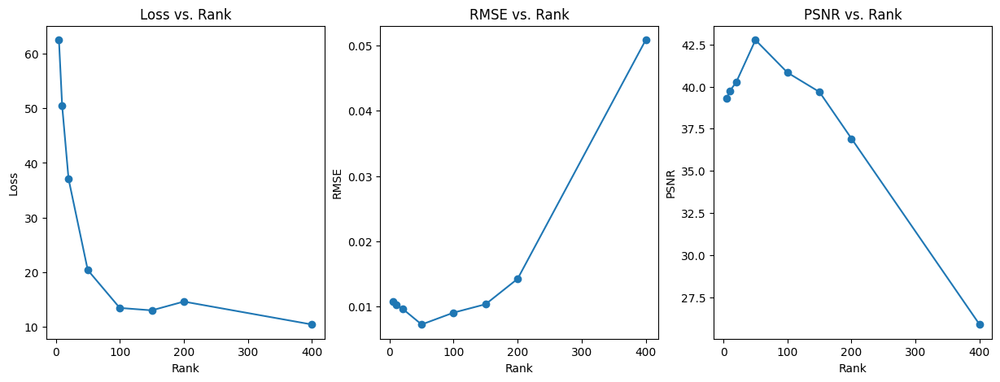

In [1]:
for rank, metrics in results_patch.items():
    print(f"Rank: {rank}, Loss: {metrics['Loss']:.4f}, RMSE: {metrics['RMSE']:.4f}, PSNR: {metrics['PSNR']:.4f}")
ranks_list = list(results_patch.keys())
loss_list = [metrics['Loss'] for metrics in results_patch.values()]
rmse_list = [metrics['RMSE'] for metrics in results_patch.values()]
psnr_list = [metrics['PSNR'] for metrics in results_patch.values()]

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.plot(ranks_list, loss_list, marker='o')
plt.xlabel('Rank')
plt.ylabel('Loss')
plt.title('Loss vs. Rank')
plt.subplot(1, 3, 2)
plt.plot(ranks_list, rmse_list, marker='o')
plt.xlabel('Rank')
plt.ylabel('RMSE')
plt.title('RMSE vs. Rank')
plt.subplot(1, 3, 3)
plt.plot(ranks_list, psnr_list, marker='o')
plt.xlabel('Rank')
plt.ylabel('PSNR')
plt.title('PSNR vs. Rank')
plt.show()


## Find the optimal rank and corresponding metrics based on the highest PSNR


In [2]:
best_psnr = max(psnr_list)
best_psnr_idx = psnr_list.index(best_psnr)
best_rank = ranks_list[best_psnr_idx]
best_rmse = rmse_list[best_psnr_idx]

print("Optimal Rank and Metrics:\n")
print(f"Rank: {best_rank}")
print(f"PSNR: {best_psnr:.4f}")
print(f"RMSE: {best_rmse:.4f}")

Optimal Rank and Metrics:

Rank: 50
PSNR: 42.7642
RMSE: 0.0073


## Observations

We can observe that the Peak Signal-to-Noise Ratio (PSNR) increases up to a certain rank (e.g., 50) and then starts decreasing as the rank continues to rise (e.g., up to 400). This behavior can be explained by the following factors:

#### 1. **Overfitting to Noise**:
   - **Low ranks (<50):** When the rank is low, the reconstructed image provides a more compressed approximation of the original image, capturing the most significant patterns in the data but discarding finer details. This results in a low PSNR since much of the original data is lost.
   - **Optimal Rank (~50):** As the rank increases, the approximation improves because more components are able to contribute to the reconstruction of the matrix, leading to better preservation of data and an increase in PSNR.
   - **High Rank (>50):** Beyond a certain rank, the model begins to capture not only the signal (important patterns) but also the **noise** present in the image. This introduces to **overfitting**, where the approximation fits both signal and random variations (noise), leading to a degradation in reconstruction quality. As a result, the overall **signal-to-noise ratio (SNR)** decreases, which negatively impacts PSNR.
   
#### 2. **Redundancy in the Data**: Real-world data matrices often exhibit redundancy due to correlations between pixels. As the rank increases, new components may provide diminishing returns by duplicating information already captured, leading to less meaningful improvements and causing overfitting.




### Summary:
- **Initial PSNR increase**: As the rank increases, more of the significant signal is captured, improving the reconstruction and increasing the PSNR.
- **PSNR peak**: TThe optimal rank balances the amount of signal and noise, resulting in the best possible reconstruction.
- **PSNR decline**: At higher ranks, overfitting to noise occurs, reducing the quality of the reconstruction and causing the PSNR to drop.

To prevent this, you can use cross-validation to find the optimal rank or apply regularization to avoid overfitting at higher ranks.
